In [1]:
# Load data from JDBC

%scala 
val driver = "org.postgresql.Driver"
val jdbcUsername = "data_sci"
val jdbcPassword = "dataSci4lyf"

val jdbcUrl = "jdbc:postgresql://cpdb-databricks.cgod7egsd6vr.us-east-2.rds.amazonaws.com/cpdb"

import java.util.Properties
val connectionProperties = new Properties()

connectionProperties.put("user", jdbcUsername)
connectionProperties.put("password", jdbcPassword)
connectionProperties.setProperty("Driver", driver)

driver: String = org.postgresql.Driver
jdbcUsername: String = data_sci
jdbcPassword: String = dataSci4lyf
jdbcUrl: String = jdbc:postgresql://cpdb-databricks.cgod7egsd6vr.us-east-2.rds.amazonaws.com/cpdb
import java.util.Properties
connectionProperties: java.util.Properties = {user=data_sci, password=dataSci4lyf, Driver=org.postgresql.Driver}
res1: Object = null

In [2]:
# Load table data_officerallegation

%scala
val data_officer_query = "(select * from data_officerallegation) data_officerallegation"
val data_officerallegation = spark.read.jdbc(url=jdbcUrl, table=data_officer_query, properties=connectionProperties)
// display(data_officerallegation.select("id"))
data_officerallegation.createOrReplaceTempView("data_officerallegation")

data_officer_query: String = (select * from data_officerallegation) data_officerallegation
data_officerallegation: org.apache.spark.sql.DataFrame = [id: int, start_date: date ... 11 more fields]

In [3]:
# Load table data_allegation

%scala
val data_officer_query = "(select * from data_allegation) data_allegation"
val data_allegation = spark.read.jdbc(url=jdbcUrl, table=data_officer_query, properties=connectionProperties)
// display(data_officerallegation.select("id"))
data_allegation.createOrReplaceTempView("data_allegation")

data_officer_query: String = (select * from data_allegation) data_allegation
data_allegation: org.apache.spark.sql.DataFrame = [id: int, crid: string ... 11 more fields]

In [4]:
# Load table data_officer

%scala
val data_officer_query = "(select * from data_officer) data_officer"
val data_officer = spark.read.jdbc(url=jdbcUrl, table=data_officer_query, properties=connectionProperties)
// display(data_officerallegation.select("id"))
data_officer.createOrReplaceTempView("data_officer")

data_officer_query: String = (select * from data_officer) data_officer
data_officer: org.apache.spark.sql.DataFrame = [id: int, gender: string ... 17 more fields]

In [5]:
# Create table for links

%sql

drop table if exists co_accusals;

Create table co_accusals as
select tb3.officer_id as id1, tb3.incident_date, tb2.officer_id as id2, tb3.allegation_id
from
  (select tb1.officer_id, tb1.allegation_id,tb2.incident_date
  from data_officerallegation as tb1, data_allegation as tb2
  where tb1.allegation_id = tb2.id) as tb3, 
  (select tb1.officer_id, tb1.allegation_id,tb2.incident_date
  from data_officerallegation as tb1, data_allegation as tb2
  where tb1.allegation_id = tb2.id) as tb2
where tb3.allegation_id = tb2.allegation_id and tb3.officer_id != tb2.officer_id;

In [6]:
# Limit links

%sql

create table co_accusals_limit as
select * from co_accusals
where id1 in 
(
  select officer_id from data_officerallegation
  group by officer_id
  order by count(id) DESC
  limit 100
)
or
id2 in 
(
	select officer_id from data_officerallegation
	group by officer_id
	order by count(id) DESC
	limit 100
);

In [7]:
from pyspark.sql.functions import *
import pandas as pd
import numpy as np

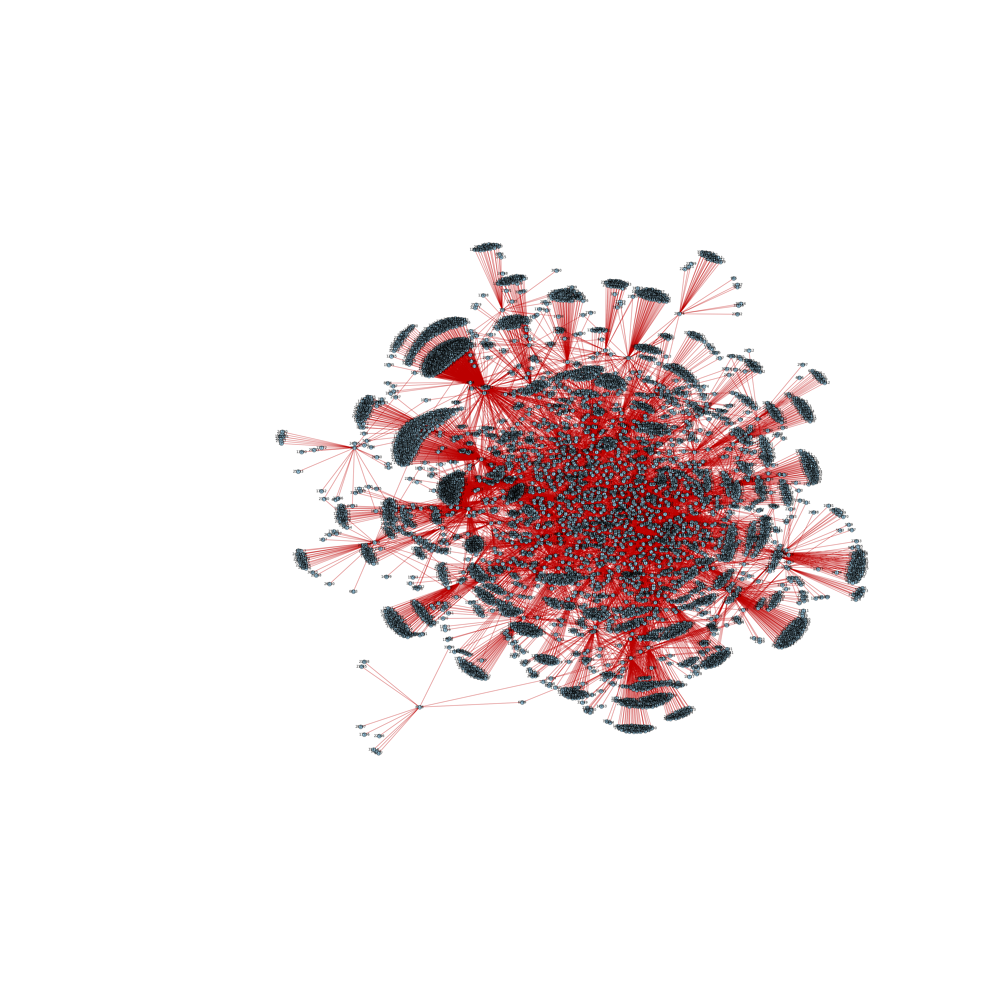

In [8]:
# Graph for data before 2015

import networkx as nx
import matplotlib.pyplot as plt
import time

edges = []
for i in range(1, 2):
  edges.append(spark.sql("SELECT id1, id2, allegation_id FROM co_accusals_limit where EXTRACT(YEAR from incident_date) <" + str(2000 + 15) ).toPandas())
  G = nx.from_pandas_edgelist(edges[-1], 'id1', 'id2', edge_attr = 'allegation_id')
  pos = nx.spring_layout(G, k = 0.05)
  fig, ax = plt.subplots(figsize=(50, 50))
  nx.draw(G,pos,node_color='#A0CBE2', node_size = 200, edge_color='#BB0000', width=1, edge_cmap=plt.cm.Blues, with_labels=True)
  display(fig)
  time.sleep(5)

In [9]:
# Page rank for data before 2015

from graphframes import *
from pyspark.sql.functions import *

vertices = spark.sql("""
SELECT id1 as id
FROM co_accusals_limit
WHERE EXTRACT(YEAR from incident_date) < 2015
GROUP BY id1 
""")

edges = spark.sql("SELECT id1 as src, id2 as dst FROM co_accusals_limit WHERE EXTRACT(YEAR from incident_date) < 2015")

g_before_2015 = GraphFrame(vertices, edges)

In [10]:
# Perform pagerank and get the results
results_before_2015 = g_before_2015.pageRank(resetProbability=0.15, tol=0.01)
print(results_before_2015)

GraphFrame(v:[id: int, pagerank: double], e:[src: int, dst: int ... 1 more field])

In [11]:
# Now, sort the results 
sorted_results = results_before_2015.vertices.sort('pagerank', ascending=False)
display(sorted_results)

id,pagerank
8138,88.971293107427
31906,73.85933693369522
2375,59.55497965626626
4844,50.93177291514222
17816,47.85829685642143
16567,45.85660812921399
1553,45.5083712258918
8562,42.970205695668405
32255,39.121435071993155
32164,36.839647949390844


In [12]:
# Convert the results to sql view 
sorted_results.createOrReplaceTempView("sortedTableB2015")

In [13]:
# Combine the officers info with  (identified by pagerank)
df_pagerank = spark.sql('SELECT data_officer.id, gender, race, rank, birth_year, first_name, last_name, pagerank from data_officer INNER JOIN sortedTableB2015 ON sortedTableB2015.id = data_officer.id ').toPandas().sort_values(by=['pagerank'], ascending=False)

print(df_pagerank)


id gender race rank birth_year \
875 8138 M Black Lieutenant 1962 
1327 31906 M Black Police Officer 1964 
1604 2375 M White Sergeant 1956 
895 4844 M Black Police Officer 1959 
3254 17816 M White Police Officer 1951 
2860 16567 M Hispanic Sergeant 1964 
3938 1553 M White Police Officer 1971 
1150 8562 M White Police Officer 1963 
4871 32255 M Hispanic Police Officer 1970 
2898 32164 F Black Police Officer 1969 
4459 18295 M White Sergeant 1963 
3338 31578 M Asian/Pacific Sergeant 1968 
2590 31119 M White Police Officer 1957 
1033 31859 M Black Sergeant 1966 
2527 12478 M Black Director Of Caps 1961 
1455 20713 M Black Police Officer 1949 
3473 23265 M Hispanic Police Officer 1970 
1167 29841 M Black Sergeant 1951 
676 24521 M Hispanic Police Officer 1968 
3526 32020 M White Police Officer 1966 
3742 27778 M White Police Officer 1973 
1133 12491 M White Sergeant 1958 
1372 21468 M White Police Officer 1965 
4129 3808 M White Sergeant 1971 
351 31899 M White Sergeant 1969 
1965 12640 M Black Sergeant 1962 
369 2015 M White Sergeant 1961 
3386 28805 M White Police Officer 1953 
3174 32336 M Black Sergeant 1968 
124 31631 M White Sergeant 1963 
... ... ... ... ... ... 
812 16024 M Hispanic Police Officer 1973 
218 21904 M Hispanic Sergeant 1959 
4131 5902 M White Detective 1977 
4886 22208 M White Police Officer 1976 
3553 26077 M White Police Officer 1973 
2728 7799 M White Sergeant 1969 
3754 19083 F Hispanic Police Officer 1963 
4672 19660 M White Police Officer 1957 
855 5335 M White Police Officer 1962 
1047 19967 M White Police Officer 1963 
4303 22321 M White Detective 1970 
294 8698 M White Sergeant 1969 
2780 3714 M White Police Officer 1973 
1367 16655 M White Sergeant 1947 
2814 18298 M White Detective 1960 
4402 3348 M White Police Officer 1967 
3094 9252 F Black Police Officer 1965 
2338 30529 M Black Sergeant 1972 
4581 5419 M Hispanic Police Officer 1980 
3101 15047 M White Police Officer 1979 
4181 1018 M White Police Officer 1976 
466 32317 M Black Police Officer 1964 
4737 6209 M White Sergeant 1965 
156 8145 M White Police Officer 1984 
3299 13727 M Black Police Officer 1964 
3326 18226 M White Field Training Officer 1972 
2351 18527 M White Police Officer 1984 
4383 12503 F Black Field Training Officer 1962 
3915 15229 M White Detective 1977 
3396 7700 F Black Police Officer 1973 

 first_name last_name pagerank 
875 Glenn Evans 88.971293 
1327 James Davis 73.859337 
1604 Marvin Bonnstetter 59.554980 
895 Michael Clifton 50.931773 
3254 Edward May 47.858297 
2860 Baudilio Lopez 45.856608 
3938 Chad Bauman 45.508371 
1150 Jerome Finnigan 42.970206 
4871 Gerardo Perez 39.121435 
2898 Tamara Matthews 36.839648 
4459 Raymond Mc Inerney 33.908375 
3338 Nick Zattair 32.829429 
2590 Kenneth Wojtan 32.406988 
1033 Eric Cato 31.894506 
2527 Ronald Holt 31.787270 
1455 Stephan Nowells 31.364892 
3473 Robert Quintero 31.232193 
1167 Tommy Walker 29.404991 
676 Carlos Rojas 29.344928 
3526 Scott Hall 29.093742 
3742 Carl Suchocki 28.286878 
1133 Bryan Holy 28.080983 
1372 Kevin Osborn 28.047957 
4129 John Cannon 27.982136 
351 Andrew Dakuras 27.792503 
1965 Edward Howard 27.784328 
369 Eugene Bikulcius 27.684087 
3386 Charles Toussas 27.673136 
3174 David Showers 26.962614 
124 Adam Zelitzky 26.552622 
... ... ... ... 
812 Christoph Lenti 0.236531 
218 Estanisla Partida 0.236531 
4131 Brian Cunningham 0.236531 
4886 Richard Peplinski 0.236531 
3553 Timothy Shanahan 0.236531 
2728 Michael Egan 0.236531 
3754 Laura Miller 0.235807 
4672 James Moriarty 0.235807 
855 Mark Cooper 0.235807 
1047 Thomas Munyon 0.235807 
4303 Andrew Perostianis 0.235807 
294 Mark Flechsig 0.235807 
2780 Vincent Calvino 0.235807 
1367 Robert Lowery 0.235807 
2814 Thomas Mc Intyre 0.235807 
4402 Robert Burke 0.235807 
3094 Sheila Fulks 0.228901 
2338 Anton White 0.228901 
4581 Oscar Corral 0.228901 
3101 John Korso 0.228901 
4181 Brian Baader 0.228901 
466 Joseph Sanders 0.226962 
4737 Louis Daray 0.226962 
156 Matthew Evans 0.226962 
3299 Ronald J

In [14]:
from collections import Counter 
# Now, perform analysis on top 50 officers as per pagerank 
df_top50 = df_pagerank[:50]
# Convert data to categorical 
df_top50['race'] = pd.Categorical(df_top50['race'])
races = df_top50['race']
most_common_races = Counter(races).most_common()
count_of_races = [c for r, c in most_common_races]
unique_races = [r for r, c in most_common_races]
print(Counter(races).most_common())


[('White', 26), ('Black', 15), ('Hispanic', 7), ('Asian/Pacific', 2)]

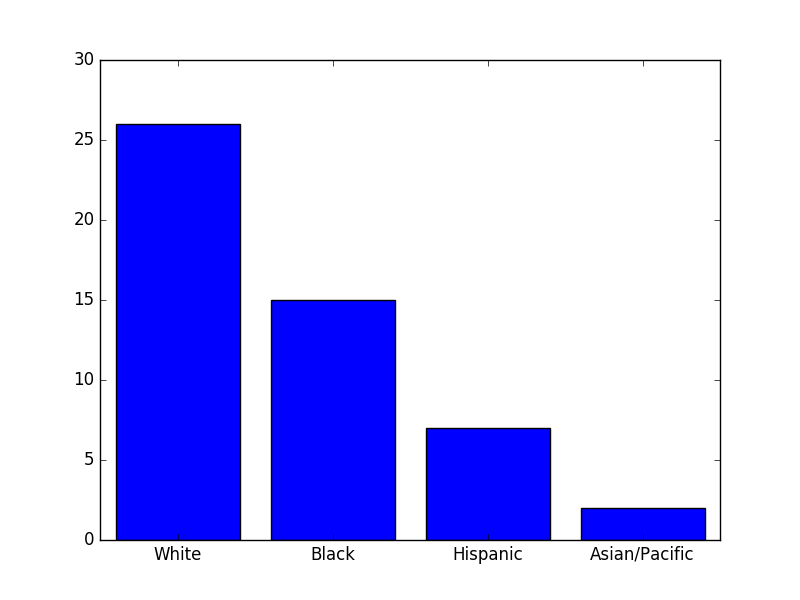

In [15]:
# Display the races in form of bar plot 
fig, axes = plt.subplots(1, 1)
x = range(len(unique_races))
plt.bar(x, count_of_races, align='center')
plt.xticks(x, unique_races)
# axes.set_xticklabels(unique_races)
display(fig)

In [16]:
# Now, let's do it for rank 
ranks = df_top50['rank']
most_common_ranks = Counter(ranks).most_common()
count_of_ranks = [c for r, c in most_common_ranks]
unique_ranks = [r for r, c in most_common_ranks]
print(Counter(ranks).most_common())

[('Police Officer', 27), ('Sergeant', 17), ('Detective', 3), ('Director Of Caps', 1), ('Commander', 1), ('Lieutenant', 1)]

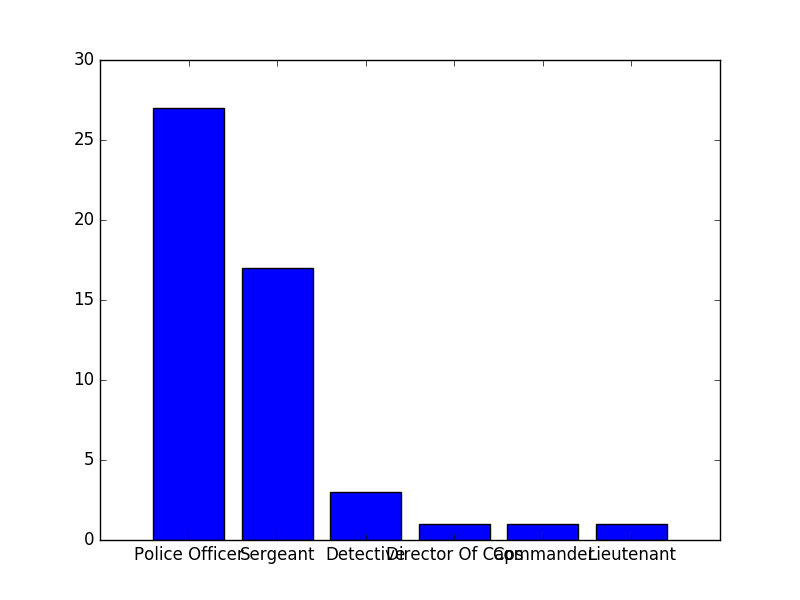

In [17]:
# Display the ranks 
fig, axes = plt.subplots(1, 1)
x = range(len(unique_ranks))
plt.bar(x, count_of_ranks, align='center')
plt.xticks(x, unique_ranks)
# axes.set_xticklabels(unique_races)
display(fig)

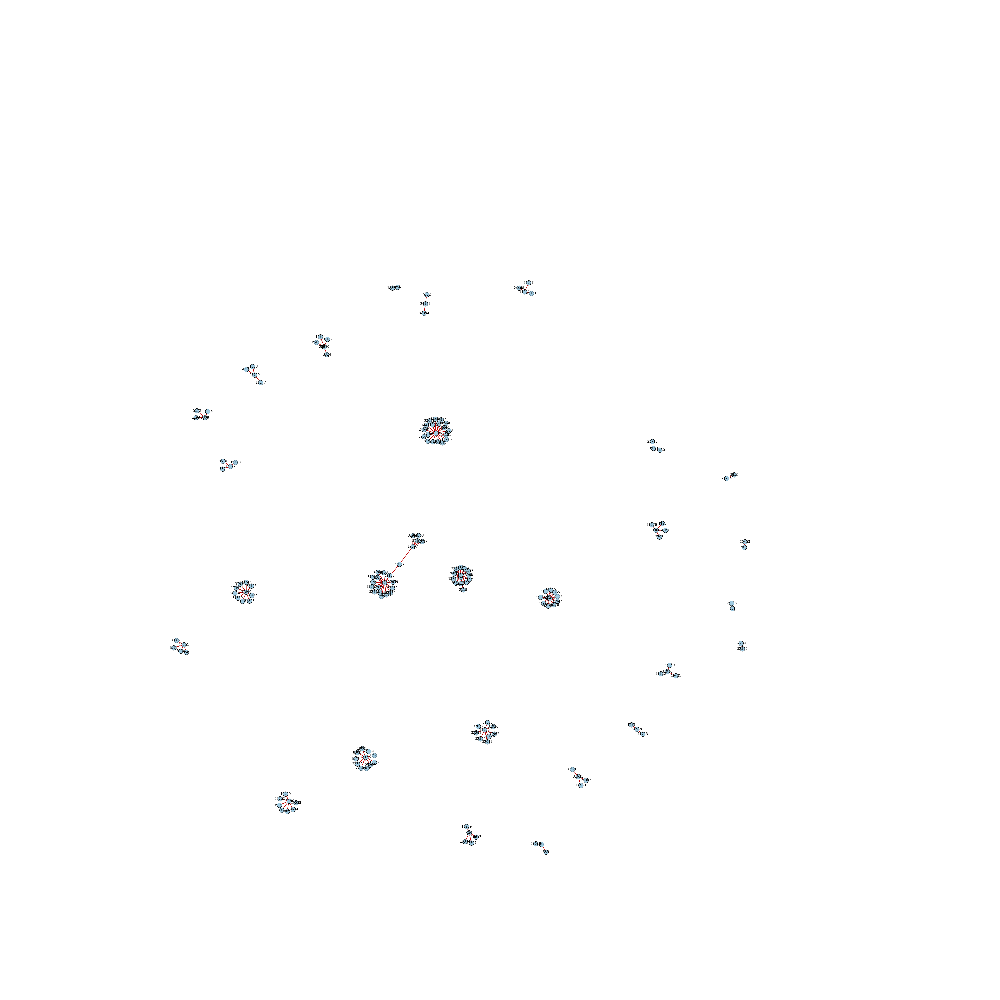

In [18]:
# Graph for data after 2015
import networkx as nx
import matplotlib.pyplot as plt
import time

edges = []
for i in range(1, 2):
  edges.append(spark.sql("SELECT id1, id2, allegation_id FROM co_accusals_limit where EXTRACT(YEAR from incident_date) >=" + str(2000 + 15) ).toPandas())
  G = nx.from_pandas_edgelist(edges[-1], 'id1', 'id2', edge_attr = 'allegation_id')
  pos = nx.spring_layout(G, k = 0.05)
  fig, ax = plt.subplots(figsize=(50, 50))
  nx.draw(G,pos,node_color='#A0CBE2', node_size = 300, edge_color='#BB0000', width=2, edge_cmap=plt.cm.Blues, with_labels=True)
  display(fig)
  time.sleep(5)

In [19]:
# Page rank for data after 2015

from graphframes import *
from pyspark.sql.functions import *

vertices = spark.sql("""
SELECT id1 as id
FROM co_accusals_limit
WHERE EXTRACT(YEAR from incident_date) >= 2015
GROUP BY id1 
""")

edges = spark.sql("SELECT id1 as src, id2 as dst FROM co_accusals_limit WHERE EXTRACT(YEAR from incident_date) >= 2015")

g = GraphFrame(vertices, edges)

In [20]:
# Perform pagerank and get the results
results = g.pageRank(resetProbability=0.15, tol=0.01)

In [21]:
# Now, sort the results 
sorted_results = results.vertices.sort('pagerank', ascending=False)
display(sorted_results)

id,pagerank
31119,8.602384652865352
32284,7.543257695752309
32166,4.997566248269665
31899,4.558725944507695
32255,4.172590355675937
11190,3.658153710050629
3897,3.613350742270343
19591,2.7831379665549316
31859,2.6801666143878022
32020,2.6801666143878022


In [22]:
# Convert the results to sql view 
sorted_results.createOrReplaceTempView("sortedTable")

ERROR: Line magic function `%sql` not found.
 Out[ 26 ]: 'select * from sortedTable'

In [23]:
# Combine the officers info with  (identified by pagerank)
df_pagerank = spark.sql('SELECT data_officer.id, gender, race, rank, birth_year, first_name, last_name, pagerank from data_officer INNER JOIN sortedTable ON sortedTable.id = data_officer.id ').toPandas().sort_values(by=['pagerank'], ascending=False)

print(df_pagerank)


id gender race rank birth_year \
96 31119 M White Police Officer 1957 
25 32284 M White Police Officer 1967 
54 32166 M Black Sergeant 1964 
17 31899 M White Sergeant 1969 
168 32255 M Hispanic Police Officer 1970 
92 11190 M Asian/Pacific Police Officer 1971 
89 3897 M White Police Officer 1970 
104 19591 M White Lieutenant 1966 
44 31859 M Black Sergeant 1966 
130 32020 M White Police Officer 1966 
12 17397 M White Police Officer 1964 
27 24521 M Hispanic Police Officer 1968 
50 9309 M White Sergeant 1967 
57 650 M Black Police Officer 1965 
43 28970 M White Sergeant 1964 
84 25799 M White Sergeant 1970 
112 31910 M Hispanic Police Officer 1972 
6 31631 M White Sergeant 1963 
40 31422 M White Police Officer 1963 
150 3808 M White Sergeant 1971 
133 17372 M White Police Officer 1963 
46 12491 M White Sergeant 1958 
123 31578 M Asian/Pacific Sergeant 1968 
157 26096 M White Police Officer 1966 
5 24128 M White Police Officer 1969 
147 30515 M White Police Officer 1983 
9 8145 M White Police Officer 1984 
20 2015 M White Sergeant 1961 
143 18830 M Hispanic Police Officer 1977 
16 17647 M White Police Officer 1966 
.. ... ... ... ... ... 
35 22430 M Hispanic Police Officer 1984 
37 24393 M Hispanic Police Officer 1976 
134 8041 M Native American/Alaskan Native Police Officer 1980 
87 13940 M Black Police Officer 1980 
53 19005 M White Police Officer 1983 
60 22760 M Asian/Pacific Police Officer 1980 
1 25203 M Hispanic Police Officer 1979 
66 28669 M Black Police Officer 1978 
91 8300 M White Police Officer 1983 
11 17392 M Hispanic Police Officer 1978 
145 32243 M White Police Officer 1973 
146 32174 M White Police Officer 1962 
61 31930 M White Police Officer 1974 
141 31898 M White Police Officer 1973 
110 32369 M Black Police Officer 1978 
160 32442 M White Police Officer 1980 
113 31945 M Black Police Officer 1966 
100 32013 M Hispanic Police Officer 1967 
48 32220 M White Police Officer 1963 
90 8443 M White Police Officer 1979 
101 13606 F White Police Officer 1974 
103 5523 M Black Police Officer 1979 
34 25631 M White Sergeant 1967 
51 26185 M White Detective 1975 
152 30081 M White Police Officer 1967 
93 24640 M Asian/Pacific Police Officer 1971 
158 17994 M White Sergeant 1968 
122 13727 M Black Police Officer 1964 
77 11400 M Black Police Officer 1970 
26 2113 M White Sergeant 1974 

 first_name last_name pagerank 
96 Kenneth Wojtan 8.602385 
25 Mark Reno 7.543258 
54 Emmett Mc Clendon 4.997566 
17 Andrew Dakuras 4.558726 
168 Gerardo Perez 4.172590 
92 Mahmoud Haleem 3.658154 
89 Thomas Carey 3.613351 
104 Richard Moravec 2.783138 
44 Eric Cato 2.680167 
130 Scott Hall 2.680167 
12 Michael Marozas 2.568440 
27 Carlos Rojas 2.376979 
50 Lawrence Gade 2.376979 
57 Maurice Anderson 2.376979 
43 Jeff Truhlar 2.376979 
84 Anthony Schulz 1.933730 
112 Daniel De Lopez 1.933730 
6 Adam Zelitzky 1.933730 
40 Daniel Young 1.933730 
150 John Cannon 1.933730 
133 Nenad Markovich 1.933730 
46 Bryan Holy 1.481519 
123 Nick Zattair 1.481519 
157 Thomas Shannon 1.481519 
5 Joseph Rizzi 1.481519 
147 Robert White 1.125045 
9 Matthew Evans 1.050359 
20 Eugene Bikulcius 1.035013 
143 Mario Mendoza 1.035013 
16 Chris Marzano 1.035013 
.. ... ... ... 
35 Jon Peulecke 0.551208 
37 Fernando Rodriguez 0.518047 
134 Luis Escobedo 0.518047 
87 Cory Junious 0.518047 
53 Paul Mieszala 0.518047 
60 Peter Pol 0.518047 
1 Armando Salgado 0.518047 
66 Matthew Toller 0.518047 
91 Daniel Fava 0.518047 
11 Michael Marose 0.486963 
145 Philip Paolino 0.486963 
146 Michael Mc Neela 0.486963 
61 Jerome Domico 0.486963 
141 John Czarnik 0.486963 
110 John Thornton 0.486963 
160 John Zinchuk 0.467227 
113 Melvin Ector 0.467227 
100 Daniel Gutierrez 0.467227 
48 Ronald Norway 0.467227 
90 John Fetzer 0.385629 
101 Ruth Johnson 0.385629 
103 James Couch 0.385629 
34 William Schield 0.385629 
51 Scott Shepard 0.385629 
152 Robert Warzocha 0.385629 
93 Paul Roque 0.385629 
158 William Mc Clelland 0.385629 
122 Ronald Jones 0.385629 
77 Lloyd Hardman 0.385629

In [24]:
from collections import Counter 
# Now, perform analysis on top 50 officers as per pagerank 
df_top50 = df_pagerank[:50]
# Convert data to categorical 
df_top50['race'] = pd.Categorical(df_top50['race'])
races = df_top50['race']
most_common_races = Counter(races).most_common()
count_of_races = [c for r, c in most_common_races]
unique_races = [r for r, c in most_common_races]
print(Counter(races).most_common())


[('White', 34), ('Hispanic', 8), ('Black', 5), ('Asian/Pacific', 3)]

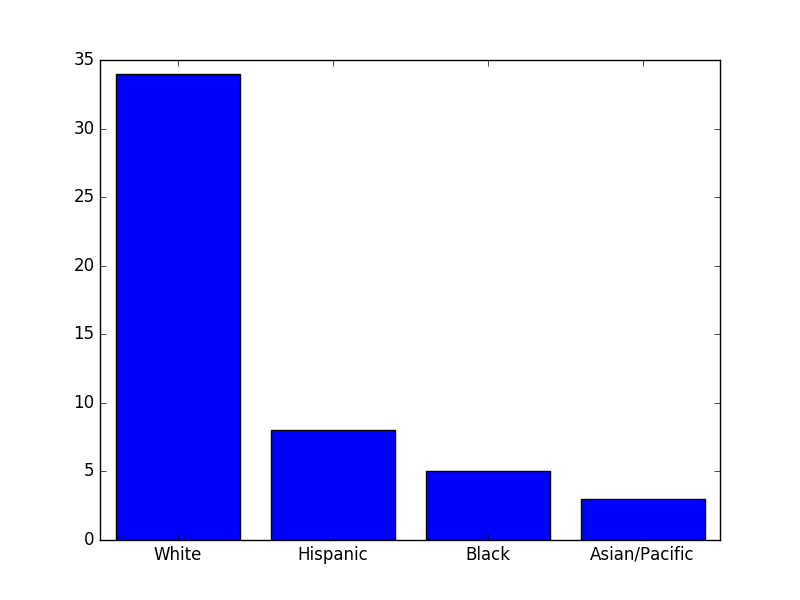

In [25]:
# Display the races in form of bar plot 
fig, axes = plt.subplots(1, 1)
x = range(len(unique_races))
plt.bar(x, count_of_races, align='center')
plt.xticks(x, unique_races)
# axes.set_xticklabels(unique_races)
display(fig)

In [26]:
# Now, let's do it for rank 
ranks = df_top50['rank']
most_common_ranks = Counter(ranks).most_common()
count_of_ranks = [c for r, c in most_common_ranks]
unique_ranks = [r for r, c in most_common_ranks]
print(Counter(ranks).most_common())

[('Police Officer', 36), ('Sergeant', 12), ('Lieutenant', 2)]

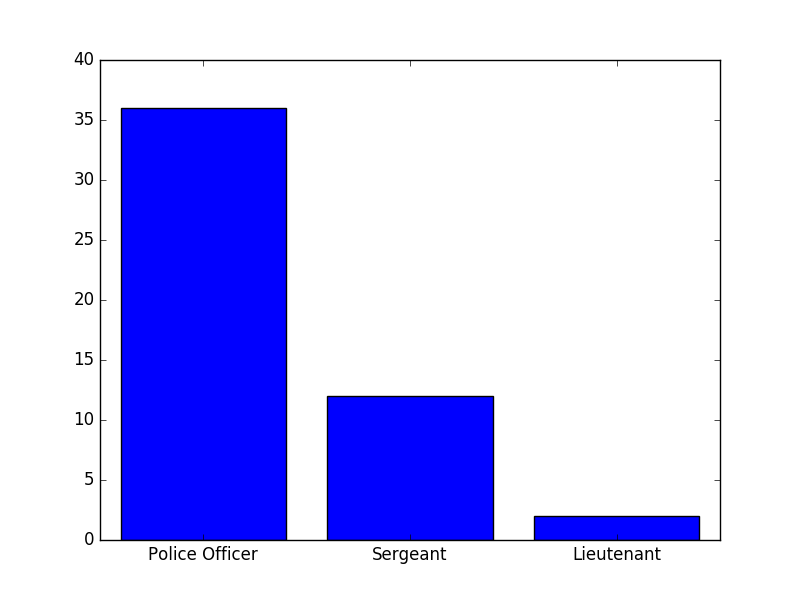

In [27]:
# Display the ranks 
fig, axes = plt.subplots(1, 1)
x = range(len(unique_ranks))
plt.bar(x, count_of_ranks, align='center')
plt.xticks(x, unique_ranks)
# axes.set_xticklabels(unique_races)
display(fig)